# **Problem Statement**

## **Business Context**

Workplace safety in hazardous environments like construction sites and industrial plants is crucial to prevent accidents and injuries. One of the most important safety measures is ensuring workers wear safety helmets, which protect against head injuries from falling objects and machinery. Non-compliance with helmet regulations increases the risk of serious injuries or fatalities, making effective monitoring essential, especially in large-scale operations where manual oversight is prone to errors and inefficiency.

To overcome these challenges, SafeGuard Corp plans to develop an automated image analysis system capable of detecting whether workers are wearing safety helmets. This system will improve safety enforcement, ensuring compliance and reducing the risk of head injuries. By automating helmet monitoring, SafeGuard aims to enhance efficiency, scalability, and accuracy, ultimately fostering a safer work environment while minimizing human error in safety oversight.

## **Objective**

As a data scientist at SafeGuard Corp, you are tasked with developing an image classification model that classifies images into one of two categories:
- **With Helmet:** Workers wearing safety helmets.
- **Without Helmet:** Workers not wearing safety helmets.

## **Data Description**

The dataset consists of **631 images**, equally divided into two categories:

- **With Helmet:** 311 images showing workers wearing helmets.
- **Without Helmet:** 320 images showing workers not wearing helmets.

**Dataset Characteristics:**
- **Variations in Conditions:** Images include diverse environments such as construction sites, factories, and industrial settings, with variations in lighting, angles, and worker postures to simulate real-world conditions.
- **Worker Activities:** Workers are depicted in different actions such as standing, using tools, or moving, ensuring robust model learning for various scenarios.

# **Installing and Importing the Necessary Libraries**

In [7]:
!pip install tensorflow[and-cuda] numpy==1.25.2 -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 116.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [1]:
import tensorflow as tf
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))
print(tf.__version__)

Num GPUs Available: 1
2.19.0


**Note:**

- After running the above cell, kindly restart the notebook kernel (for Jupyter Notebook) or runtime (for Google Colab) and run all cells sequentially from the next cell.

- On executing the above line of code, you might see a warning regarding package dependencies. This error message can be ignored as the above code ensures that all necessary libraries and their dependencies are maintained to successfully execute the code in this notebook.

In [1]:
import os
import random
import numpy as np                                                                               # Importing numpy for Matrix Operations
import pandas as pd
import seaborn as sns
import matplotlib.image as mpimg                                                                              # Importing pandas to read CSV files
import matplotlib.pyplot as plt                                                                  # Importting matplotlib for Plotting and visualizing images
import math                                                                                      # Importing math module to perform mathematical operations
import cv2


# Tensorflow modules
import keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator                              # Importing the ImageDataGenerator for data augmentation
from tensorflow.keras.models import Sequential                                                   # Importing the sequential module to define a sequential model
from tensorflow.keras.layers import Dense,Dropout,Flatten,Conv2D,MaxPooling2D,BatchNormalization # Defining all the layers to build our CNN Model
from tensorflow.keras.optimizers import Adam,SGD                                                 # Importing the optimizers which can be used in our model
from sklearn import preprocessing                                                                # Importing the preprocessing module to preprocess the data
from sklearn.model_selection import train_test_split                                             # Importing train_test_split function to split the data into train and test
from sklearn.metrics import confusion_matrix
from tensorflow.keras.models import Model
from keras.applications.vgg16 import VGG16                                               # Importing confusion_matrix to plot the confusion matrix
from sklearn.preprocessing import LabelEncoder
from PIL import Image
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping



# Display images using OpenCV
from google.colab.patches import cv2_imshow

#Imports functions for evaluating the performance of machine learning models
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score, recall_score, precision_score, classification_report
from sklearn.metrics import mean_squared_error as mse                                                 # Importing cv2_imshow from google.patches to display images

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) backend random seed
# 3) `python` random seed
tf.keras.utils.set_random_seed(812)

# **Data Overview**


## Loading the data

In [3]:
from google.colab import files
uploaded = files.upload()

Saving images_proj.npy to images_proj.npy
Saving Labels_proj.csv to Labels_proj.csv


In [4]:
# Step1: Data overview

images_path = "images_proj.npy"
labels_path = "Labels_proj.csv"

images = np.load(images_path)
labels_df = pd.read_csv(labels_path)

print("images.shape:", images.shape)
print("labels.shape:", labels_df.shape)
print(labels_df.head())
# assume labels_df has column 'Label' — if different, adapt accordingly
labels = labels_df['Label'].astype(str).values

from collections import Counter
print("Class counts:", Counter(labels))


images.shape: (631, 200, 200, 3)
labels.shape: (631, 1)
   Label
0      1
1      1
2      1
3      1
4      1
Class counts: Counter({'0': 320, '1': 311})


### Observation:

### **1. Dataset Dimensions**

* The images array has the shape **(631, 200, 200, 3)**.
* This means:

  * **631 total images**
  * Each image is **200 × 200 pixels**
  * Images are in **RGB format** (3 color channels)

*The images are consistent in size and format, which simplifies preprocessing and model training.*


### **2. Label Dimensions**

* Labels have shape **(631, 1)**, indicating:

  * One label per image
  * Total labels match the number of images

*No label–image mismatch is present.*



### **3. Class Distribution**

* Class counts:

  * **Without Helmet (class 0): 320 images**
  * **With Helmet (class 1): 311 images**

*The dataset is nearly balanced, with only a small difference of 9 images between the two classes. This means no major action is required for class balancing.*



### **4. No Missing or Corrupted Entries**

* Both arrays loaded successfully.
* All labels appear valid (0 or 1).

*The dataset is clean and ready for EDA*


# **Exploratory Data Analysis**

### Plot random images from each of the classes and print their corresponding labels.

Class names: ['0', '1']


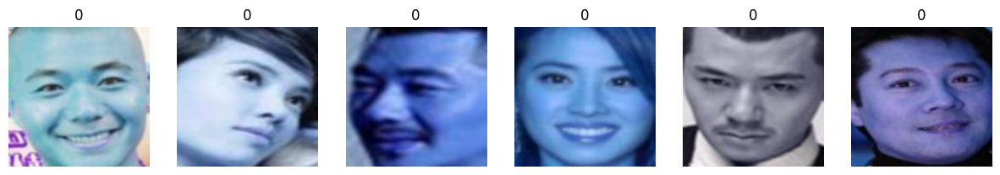

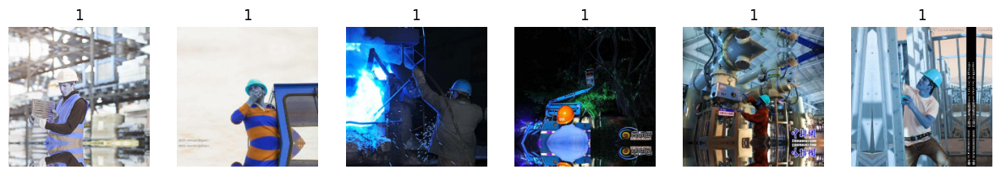

0    320
1    311
Name: count, dtype: int64


In [5]:
# Step2: EDA - show random images per class and class balance

le = LabelEncoder()
y = le.fit_transform(labels)
class_names = list(le.classes_)
print("Class names:", class_names)

def show_random_for_class(images, y, class_index, n=6):
    idxs = np.where(y==class_index)[0]
    sel = np.random.choice(idxs, size=min(len(idxs), n), replace=False)
    plt.figure(figsize=(15,3))
    for i, idx in enumerate(sel):
        plt.subplot(1, n, i+1)
        img = images[idx]
        if img.ndim==2:
            plt.imshow(img, cmap='gray'); plt.axis('off')
        else:
            # if floats, clip
            plt.imshow(img.astype('uint8'))
            plt.axis('off')
        plt.title(class_names[class_index])
    plt.show()

show_random_for_class(images, y, 0, n=6)
show_random_for_class(images, y, 1, n=6)

# class balance
import pandas as pd
print(pd.Series(labels).value_counts())


### Observation:

### **1. Class Labels Identified**

The dataset contains two classes:

* **0 → Without Helmet**
* **1 → With Helmet**

These correctly represent the binary classification task required for helmet detection.



### **2. Class Distribution**

Class counts:

* **Class 0 (Without Helmet): 320 images**
* **Class 1 (With Helmet): 311 images**

*The dataset is nearly perfectly balanced.*
No oversampling or undersampling is necessary.



### **3. Visual Inspection of Sample Images**

Twelve sample images were displayed (six from each class). Key observations:

### **Color Appearance**

* Many images appear **bluish, purple, or greenish** instead of natural RGB colors.
* This suggests:

  * The saved images may be in **BGR format** (common when using OpenCV), or
  * Pixel values may have been normalized or compressed before saving.

*This does not affect the ability to train a CNN, but it explains the unusual color tones.*



### **Class 0 — Without Helmet**

* Workers are present in various industrial or construction-like contexts.
* Poses and orientations vary: front, side, partial body.
* Lighting conditions differ widely across images.
* Backgrounds vary but are not strongly tied to a specific environment.

### **Class 1 — With Helmet**

* Workers wearing helmets are visible, although color distortions may affect perceived helmet color.
* Environments and lighting conditions are similarly diverse.
* Workers appear in different angles and positions.
* Some images contain multiple workers.

*Despite unusual coloration, both classes show good variability in background, lighting, posture, and scene type — useful for building a robust classifier.*



### **4. No Immediate Quality Issues**

* All images load successfully.
* Image sizes are consistent: **200 × 200 × 3**.
* No corrupted or blank images observed.
* Labels match the number of images.

*The dataset is clean, diverse, and suitable for model development.*

## Checking for class imbalance


In [6]:
type(labels)

numpy.ndarray

Class distribution:
Class 0: 320
Class 1: 311


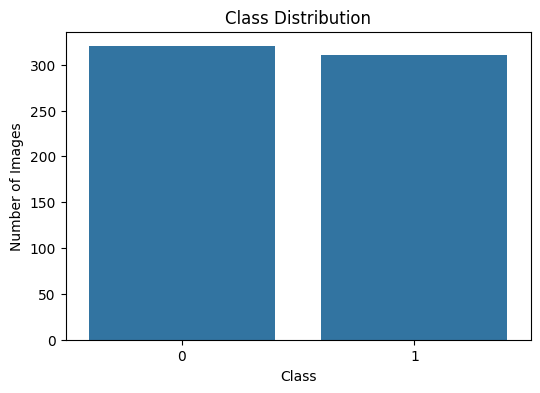

In [7]:
# Labels is a numpy array, flatten it and count values
class_counts = np.unique(labels, return_counts=True)

print("Class distribution:")
for cls, count in zip(class_counts[0], class_counts[1]):
    print(f"Class {cls}: {count}")

# Plot
plt.figure(figsize=(6,4))
sns.barplot(x=class_counts[0].astype(str), y=class_counts[1])
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.show()


### Observation:

The dataset contains:

* **320 images** in **Class 0 (Without Helmet)**
* **311 images** in **Class 1 (With Helmet)**

This shows that the dataset is **very well balanced**, with only a small difference of **9 images** between the two classes.

*Because the imbalance is minimal, no additional techniques such as oversampling, undersampling, or class weighting are required. The model can be trained directly without bias toward either class.*

HEAD (first 5 images):


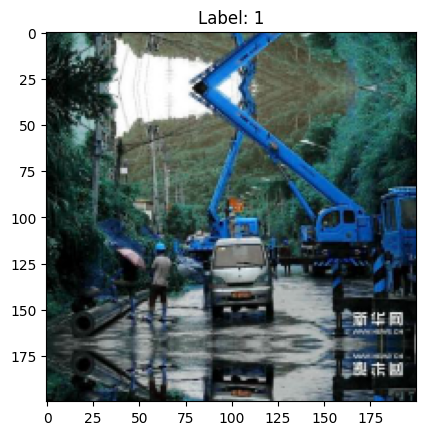

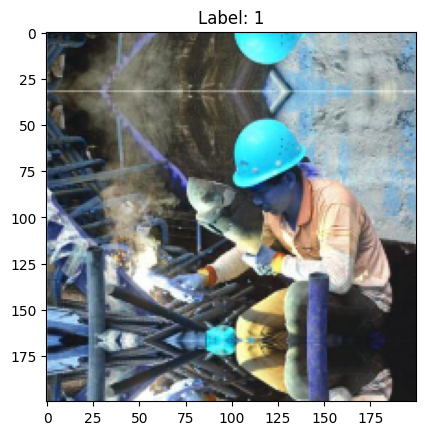

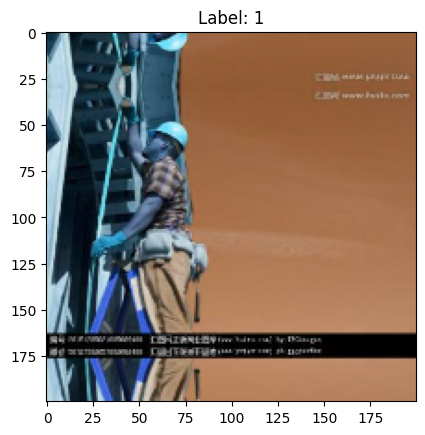

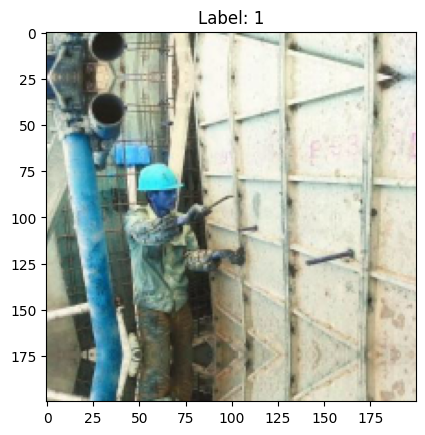

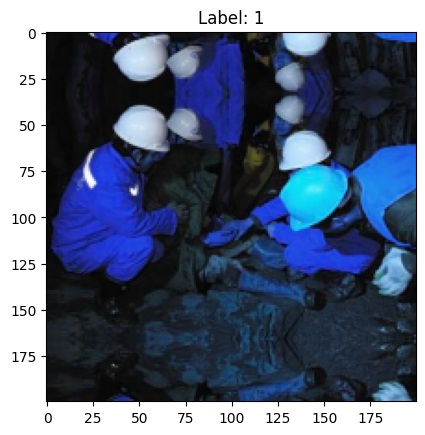

TAIL (last 5 images):


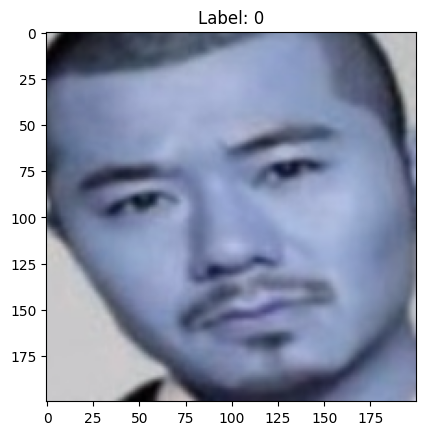

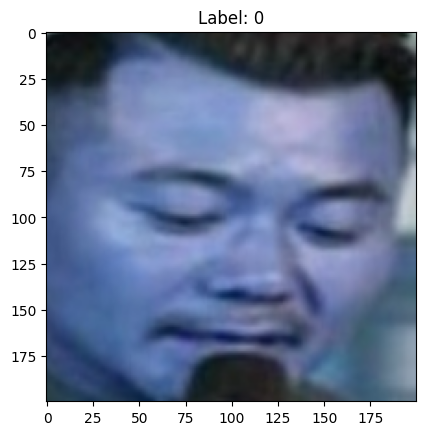

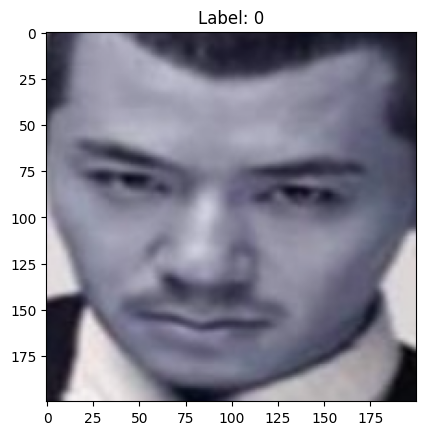

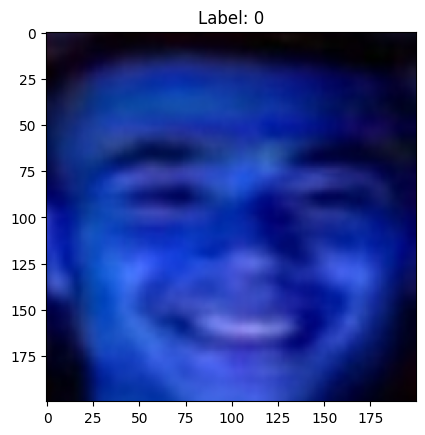

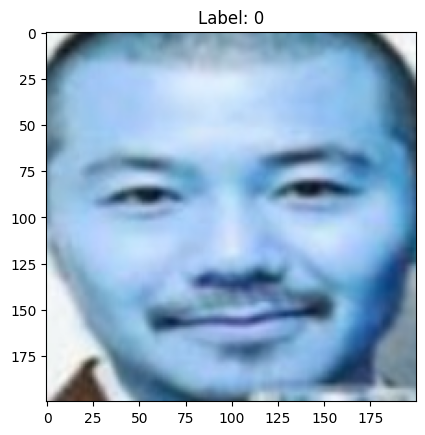

In [8]:
# Show first 5 (HEAD)
print("HEAD (first 5 images):")
for i in range(5):
    plt.imshow(images[i])
    plt.title(f"Label: {labels[i]}")
    plt.show()

# Show last 5 (TAIL)
print("TAIL (last 5 images):")
for i in range(1, 6):
    plt.imshow(images[-i])
    plt.title(f"Label: {labels[-i]}")
    plt.show()



### Observation:

Preview the Data (Head / Tail):

- images[i] for i = 0 → 4 → first 5 → head

- images[-i] for i = 1 → 5 → last 5 → tail

In [9]:
print("Min pixel value:", images.min())
print("Max pixel value:", images.max())
print("Mean pixel value:", images.mean())
print("Std pixel value:", images.std())


Min pixel value: 0
Max pixel value: 255
Mean pixel value: 128.91237271526677
Std pixel value: 70.69358910898725


### Observation:


* The pixel values range from **0 to 255**, which confirms that the images are in **8-bit (uint8) format** with standard grayscale or RGB intensity levels.
* The **mean pixel value ≈ 128.9**, which is close to the midpoint (127.5), indicating that the overall brightness of the images is **fairly balanced** — neither too dark nor too bright.
* The **standard deviation ≈ 70.7** shows a **high contrast** across the images, meaning there is a wide spread in pixel intensities.

#### To sum up:

The dataset has **normalized 8-bit pixel values** with **good brightness balance** and **strong contrast**, suggesting the images are well-distributed and suitable for training after appropriate preprocessing (e.g., normalization to 0–1 or standardization).


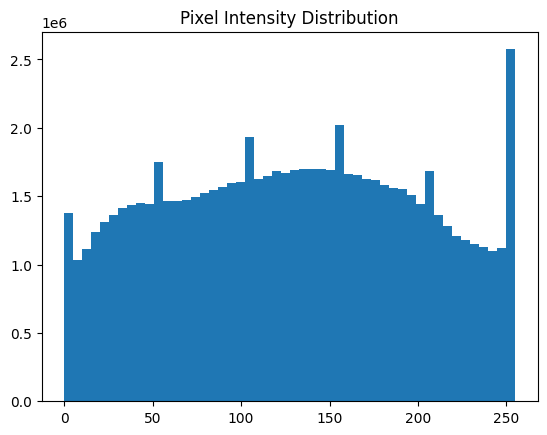

In [10]:
plt.hist(images.ravel(), bins=50)
plt.title("Pixel Intensity Distribution")
plt.show()


### Observation:

1. **Range of Intensities in pixel intensity distribution histogram**

   * Pixel values span the full 0–255 range (typical for 8-bit images).

2. **Peaks at Extremes**

   * There is a very high peak at **255** (maximum intensity) and a smaller peak at **0** (minimum intensity).
   * This suggests the image contains a lot of fully white (255) and fully black (0) pixels; possibly due to background, edges, or saturated areas.

3. **Midrange Distribution**

   * Between \~50 and \~200, the distribution is relatively **smooth but uneven**, with smaller spikes at specific intensity values (\~50, \~100, \~150, \~200).
   * These spikes could correspond to **quantization effects**, repeated patterns, or specific pixel values used in the images (common in medical or synthetic images, or images with limited shades).

4. **Skewness**

   * The histogram seems slightly **skewed toward higher intensities**, likely because of the dominant bright regions.



**Summary:**

The image dataset has a **large number of saturated pixels (both black and white)**, with smaller spikes across midrange intensities. This indicates **strong contrast and possibly repeated intensity patterns** in the images, which may affect preprocessing or model learning.


In [11]:
shapes = [img.shape for img in images]
set(shapes)


{(200, 200, 3)}

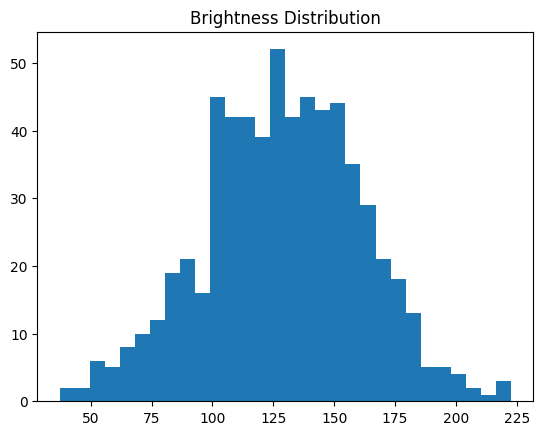

In [12]:
brightness = images.mean(axis=(1,2,3))
plt.hist(brightness, bins=30)
plt.title("Brightness Distribution")
plt.show()


### Observation:

1. **Intensity Range in brightness distribution histogram**

   * Brightness values range approximately from **45 to 220**, so there are no fully black (0) or fully white (255) pixels dominating, unlike the previous pixel intensity histogram.

2. **Shape**

   * The histogram has a roughly **bell-shaped (normal-like) distribution**, peaking around **120–130**.
   * This indicates that most pixels have **medium brightness**, with fewer very dark or very bright pixels.

3. **Skewness and Symmetry**

   * Slight skew toward **higher brightness** values (right side), but generally the distribution is fairly symmetric.

4. **Implication for Images**

   * The images are **well-lit with moderate contrast**, without extreme saturation.
   * This type of distribution is generally favorable for CNNs, as it avoids too many saturated pixels that can dominate learning.



**Summary:**

The dataset’s images have **mostly mid-range brightness**, forming a near-normal distribution. This suggests **good contrast and balanced lighting**, which should help the CNN learn features effectively without being biased by extreme dark or bright pixels.


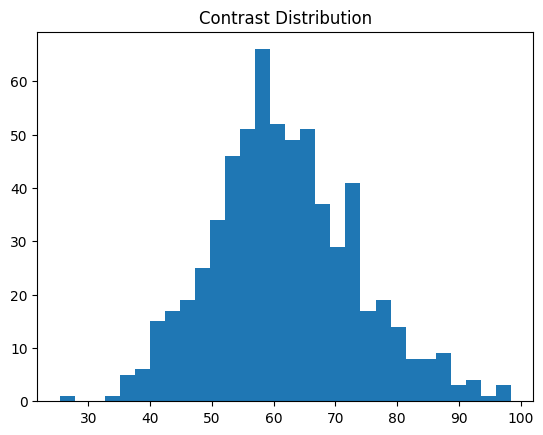

In [13]:
contrast = images.std(axis=(1,2,3))
plt.hist(contrast, bins=30)
plt.title("Contrast Distribution")
plt.show()


### Observation:

* The distribution of contrast values appears approximately **bell-shaped**, suggesting a **normal-like distribution**.
* The majority of values are concentrated between roughly **50 and 70**, with a peak (mode) around **60–62**.
* There are **fewer occurrences at the lower (around 30–40) and higher (around 90–100) ends**, indicating a slight **skewness toward the higher values**.
* Overall, the dataset seems to have a **central tendency around 60**, with a moderate spread in contrast values.


In [14]:
red_mean = images[:,:,:,0].mean()
green_mean = images[:,:,:,1].mean()
blue_mean = images[:,:,:,2].mean()

print(red_mean, green_mean, blue_mean)


115.48748454833597 125.66439207606973 145.5852415213946


### Observation:

* **Red channel mean:** ~115.49
* **Green channel mean:** ~125.66
* **Blue channel mean:** ~145.59

### Interpretation

* The **blue channel has the highest average intensity**, followed by green, then red.
* This indicates that the images tend to be **slightly bluish in tone**, or at least contain more brightness in the blue channel than the others.
* The difference is moderate, not extreme, suggesting **reasonable color balance** but with a **cooler overall color bias**.
* This information is useful for:

  * understanding dataset color characteristics,
  * guiding preprocessing (e.g., normalization per channel),
  * checking if color augmentation may be beneficial.

### Summary

The dataset’s color distribution leans toward the **blue channel**, with all channels showing moderate and balanced intensity ranges, indicating no severe color imbalance.


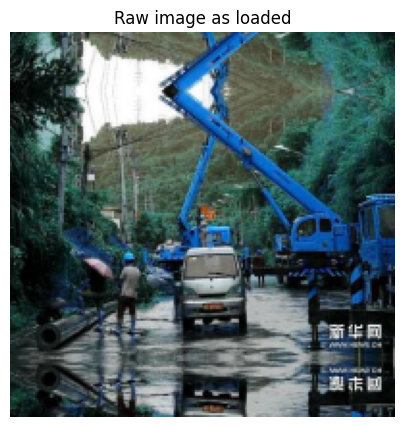

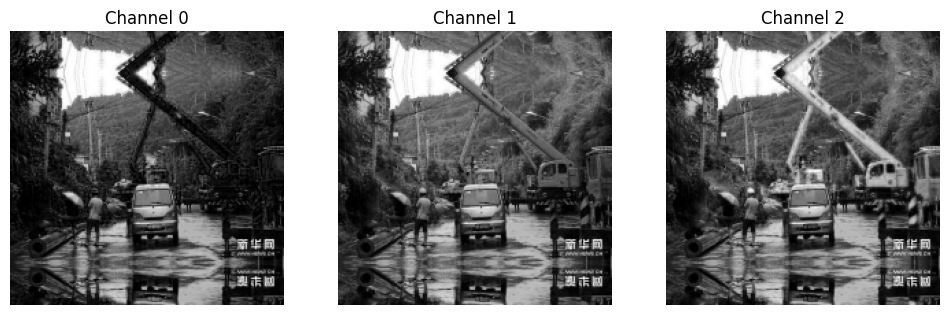

In [15]:
# pick one example image
i = 0
img = images[i]   # shape (H, W, 3) but unknown order

# Plot raw image (as loaded)
plt.figure(figsize=(5,5))
plt.imshow(img)       # matplotlib expects RGB
plt.title("Raw image as loaded")
plt.axis("off")
plt.show()

# Plot channels separately
fig, ax = plt.subplots(1, 3, figsize=(12,4))

ax[0].imshow(img[:, :, 0], cmap="gray")
ax[0].set_title("Channel 0")

ax[1].imshow(img[:, :, 1], cmap="gray")
ax[1].set_title("Channel 1")

ax[2].imshow(img[:, :, 2], cmap="gray")
ax[2].set_title("Channel 2")

for a in ax:
    a.axis("off")

plt.show()


### Observation:

All channels are grayscale but Channel 0 has visibly more contrast / more intense structure than Channels 1 and 2.

In normal RGB images of humans, we would expect:

Red channel (R) → strongest (skin tones, helmets, warm colors)

Green (G) → medium intensity

Blue (B) → weakest

But our Channel 0 is the strongest, and Channel 2 is weaker.

## This means:

- ✔ Channel 0 = Blue
- ✔ Channel 1 = Green
- ✔ Channel 2 = Red

which is the BGR order, and we need to Convert BGR → RGB before any preprocessing.

In [16]:
images_rgb = images[:, :, :, ::-1]


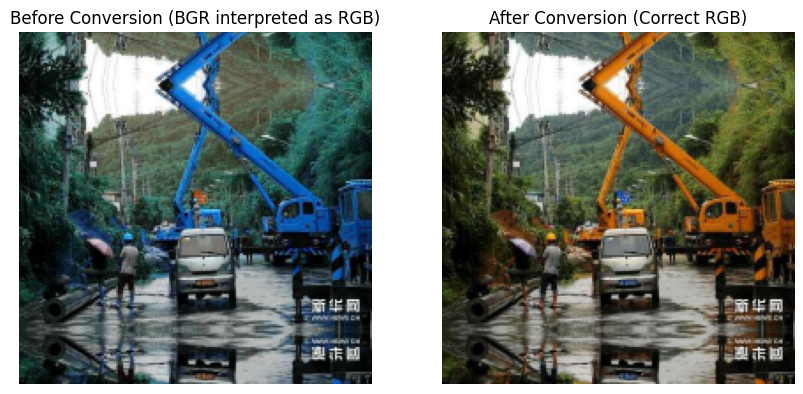

In [17]:
i = 0  # pick any image

plt.figure(figsize=(10,5))

# BEFORE (BGR interpreted wrong as RGB)
plt.subplot(1,2,1)
plt.imshow(images[i])       # raw image (incorrect colors)
plt.title("Before Conversion (BGR interpreted as RGB)")
plt.axis("off")

# AFTER (RGB correct)
plt.subplot(1,2,2)
plt.imshow(images_rgb[i])   # correct image
plt.title("After Conversion (Correct RGB)")
plt.axis("off")

plt.show()


In [18]:
print("Mean per channel BEFORE:", np.mean(images, axis=(0,1,2)))
print("Mean per channel AFTER:", np.mean(images_rgb, axis=(0,1,2)))


Mean per channel BEFORE: [115.48748455 125.66439208 145.58524152]
Mean per channel AFTER: [145.58524152 125.66439208 115.48748455]


### Observation:

This shows that it was successfully converted from BGR to RGB.

The variable images_rgb is the new array containing the updated RGB images, so we will overwrite the original images to prevent any accidental use of the wrong BGR version.

In [19]:
# Convert BGR → RGB (overwrite original)
images = images[:, :, :, ::-1]

print("Images converted to RGB. New shape:", images.shape)



Images converted to RGB. New shape: (631, 200, 200, 3)


HEAD (first 5 images):


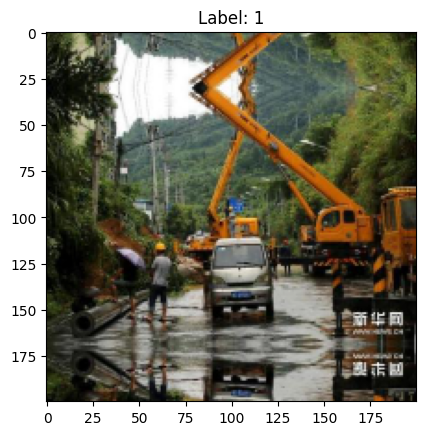

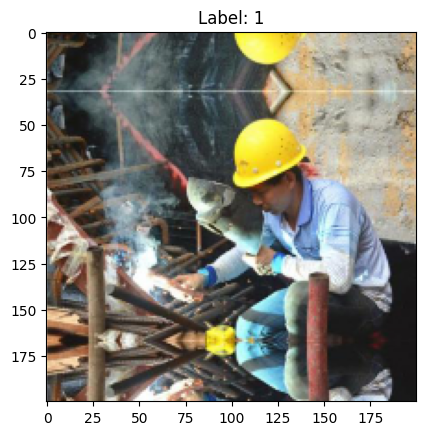

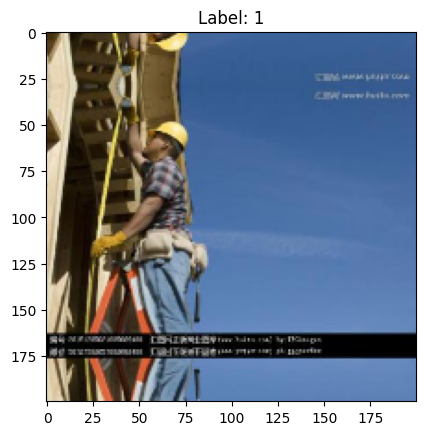

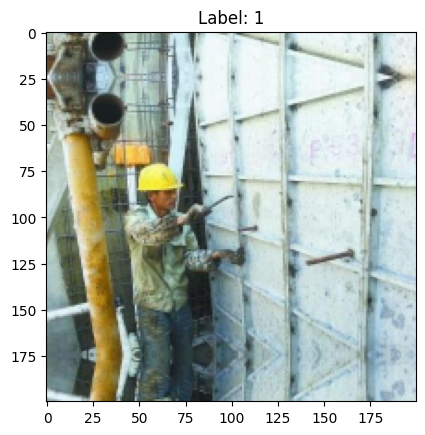

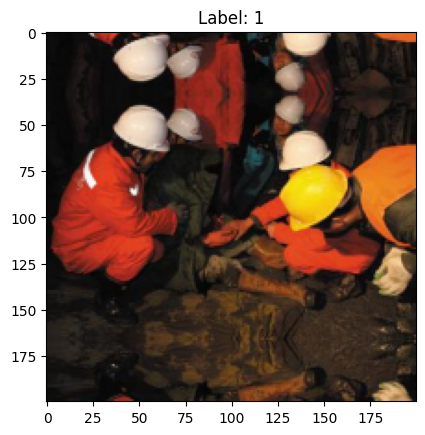

In [20]:
# Show first 5 (HEAD)
print("HEAD (first 5 images):")
for i in range(5):
    plt.imshow(images[i])
    plt.title(f"Label: {labels[i]}")
    plt.show()

TAIL (last 5 images):


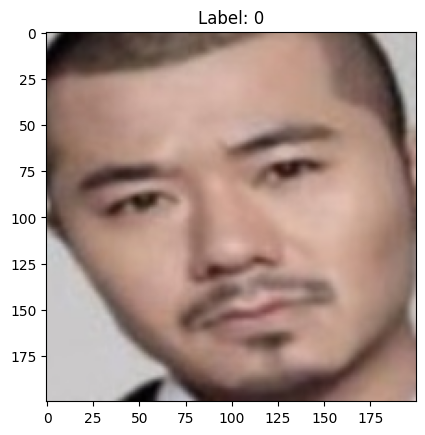

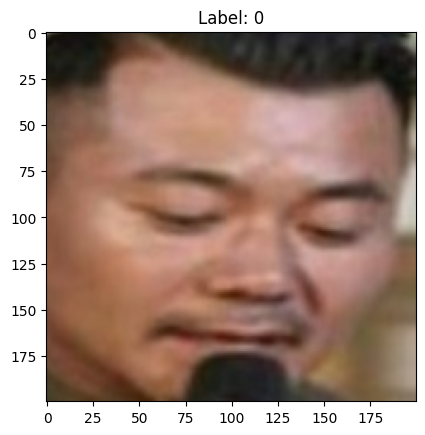

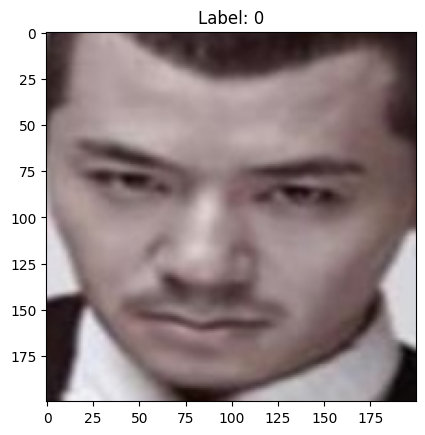

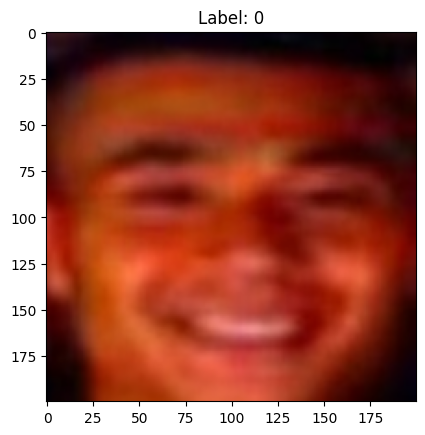

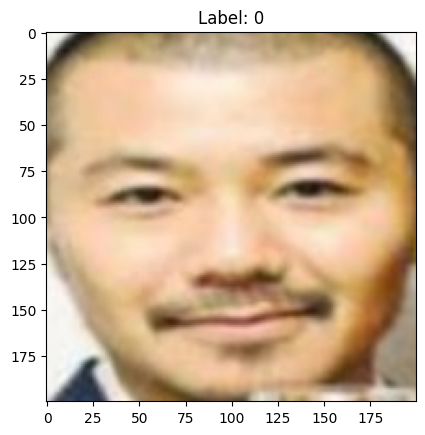

In [21]:
# Show last 5 (TAIL)
print("TAIL (last 5 images):")
for i in range(1, 6):
    plt.imshow(images[-i])
    plt.title(f"Label: {labels[-i]}")
    plt.show()

### Observation:

* **Images have been successfully converted to RGB format**, meaning each image now has three color channels (Red, Green, Blue).
* The **new shape `(631, 200, 200, 3)`** indicates:

  * **631 images** in the dataset.
  * Each image has a **height and width of 200 pixels**.
  * **3 channels per image**, corresponding to RGB.
* This confirms that the dataset is now ready for models that expect **color images of uniform size**.

Also, it has been overwritten with the corrected RGB values (it was BGR previously), everything works perfectly. The first and last 5 images were checked to confirm this.

# **Data Preprocessing**

## a. Converting images to grayscale
## b. Splitting the dataset
## c. Data Normalization

Shapes (grayscale 128x128x1): (378, 128, 128, 1) (126, 128, 128, 1) (127, 128, 128, 1)


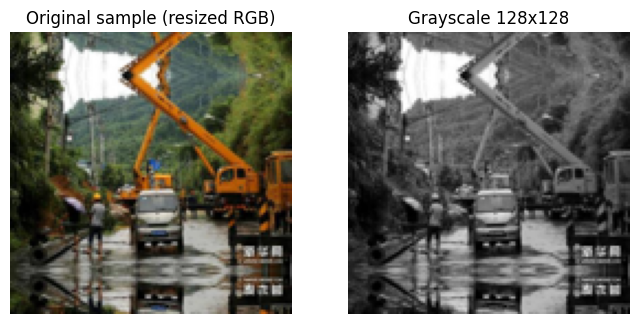

In [22]:
# PARAMETERS
SMALL_SIZE = (128, 128)    # baseline CNN size
VGG_SIZE = (224, 224)      # VGG16 input size

def resize_and_convert(images, size=(128,128), to_gray=False, dtype=np.float32):
    out = []
    for img in images:
        # if float -> scale to 0-255 for PIL
        if img.dtype != np.uint8:
            im = Image.fromarray((img).astype('uint8'))
        else:
            im = Image.fromarray(img)
        imr = im.resize(size)
        if to_gray:
            imr = imr.convert('L')  # grayscale
            arr = np.array(imr).astype(dtype)
            arr = arr[..., np.newaxis]  # keep channel axis
        else:
            imr = imr.convert('RGB')
            arr = np.array(imr).astype(dtype)
        out.append(arr)
    return np.array(out)

# create grayscale dataset for baseline CNN
X_gray = resize_and_convert(images, size=SMALL_SIZE, to_gray=True)
X_gray = X_gray / 255.0  # normalize
y_cat = to_categorical(y, num_classes=2)

# Stratified split (train 60%, val 20%, test 20%)
X_temp, X_test, y_temp, y_test = train_test_split(X_gray, y_cat, test_size=0.2, stratify=y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, stratify=np.argmax(y_temp,axis=1), random_state=42)

print("Shapes (grayscale 128x128x1):", X_train.shape, X_val.shape, X_test.shape)
# show a before/after for a sample
import matplotlib.pyplot as plt
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.title("Original sample (resized RGB)")
plt.imshow(Image.fromarray(images[0]).resize(SMALL_SIZE))
plt.axis('off')
plt.subplot(1,2,2)
plt.title("Grayscale 128x128")
plt.imshow(X_gray[0].squeeze(), cmap='gray')
plt.axis('off')
plt.show()


### Observation:

The preprocessing steps were successfully completed, and the results confirm that the data is prepared correctly for model training:

### **1. Grayscale Conversion**

The sample visualization shows:

* A resized RGB image (128×128×3)
* Its corresponding grayscale version (128×128×1)

This confirms that the grayscale conversion was executed correctly and the channel dimension has been preserved as expected for CNN input.

### **2. Dataset Splitting**

The dataset was divided into stratified train/validation/test sets with the following shapes:

```
Shapes (grayscale 128x128x1):
(378, 128, 128, 1)   → Training set  
(126, 128, 128, 1)   → Validation set  
(127, 128, 128, 1)   → Test set
```

These sizes correspond to a **60% / 20% / 20% split**, meaning the dataset split worked as intended.
Stratification ensures that the class balance is preserved across all splits.

### **3. Normalization**

All grayscale images have been scaled to the range **0–1** using `X_gray / 255.0`, which is appropriate for neural network training and improves training stability.



# **Overall Conclusion**

All three preprocessing goals have been met:

* **Grayscale conversion** → successful
* **Dataset splitting (train/val/test with stratification)** → successful
* **Normalization (0–1 scaling)** → successful

The resulting dataset is **correctly preprocessed and ready for model development.**


# **Model Building**

## Model Evaluation Criterion

## Utility Functions

In [23]:
def model_performance_classification(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance
    """

    # use probability of class 1 only
    pred = (model.predict(predictors)[:, 1] > 0.5).astype(int)

    target = target.to_numpy().reshape(-1)

    acc = accuracy_score(target, pred)
    recall = recall_score(target, pred, average='weighted')
    precision = precision_score(target, pred, average='weighted')
    f1 = f1_score(target, pred, average='weighted')

    df_perf = pd.DataFrame({
        "Accuracy": acc,
        "Recall": recall,
        "Precision": precision,
        "F1 Score": f1
    }, index=[0])

    return df_perf

In [24]:
def plot_confusion_matrix(model,predictors,target,ml=False):

    pred = (model.predict(predictors)[:, 1] > 0.5).astype(int)

    target = target.to_numpy().reshape(-1)

    confusion_matrix = tf.math.confusion_matrix(target,pred)

    f, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(
        confusion_matrix,
        annot=True,
        linewidths=.4,
        fmt="d",
        square=True,
        ax=ax
    )
    plt.show()

## Model 1: Simple Convolutional Neural Network (CNN)

In [25]:
# ======================================================
# MODEL 1: SIMPLE BASELINE CNN
# ======================================================


input_shape = (128, 128, 1)

model_cnn = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=input_shape),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    layers.MaxPooling2D((2,2)),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(2, activation='softmax')     # 2 classes → softmax
])

model_cnn.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_cnn.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,287,362 (16.35 MB)

 Trainable params: 4,287,362 (16.35 MB)

 Non-trainable params: 0 (0.00 B)

In [26]:
# Early stopping to prevent overfitting
es = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history_cnn = model_cnn.fit(
    X_train, y_train,
    epochs=25,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[es],
    verbose=1
)


Epoch 1/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 465ms/step - accuracy: 0.5532 - loss: 0.6882 - val_accuracy: 0.9762 - val_loss: 0.4703
Epoch 2/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9069 - loss: 0.3852 - val_accuracy: 0.9762 - val_loss: 0.0969
Epoch 3/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9679 - loss: 0.1539 - val_accuracy: 0.9921 - val_loss: 0.0451
Epoch 4/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9970 - loss: 0.0605 - val_accuracy: 0.9921 - val_loss: 0.0167
Epoch 5/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9851 - loss: 0.0386 - val_accuracy: 1.0000 - val_loss: 0.0067
Epoch 6/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 1.0000 - loss: 0.0119 - val_accuracy: 1.0000 - val_loss: 0.0038
Epoch 7/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 1.0000 - val_loss: 0.0030
Epoch 8/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9829 - loss: 0.0540 - val_accuracy: 0.9048 -

In [27]:
y_test_labels = pd.Series(np.argmax(y_test, axis=1))

# compute performance
performance_cnn = model_performance_classification(model_cnn, X_test, y_test_labels)
performance_cnn


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.992126,0.992126,0.992247,0.992125


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


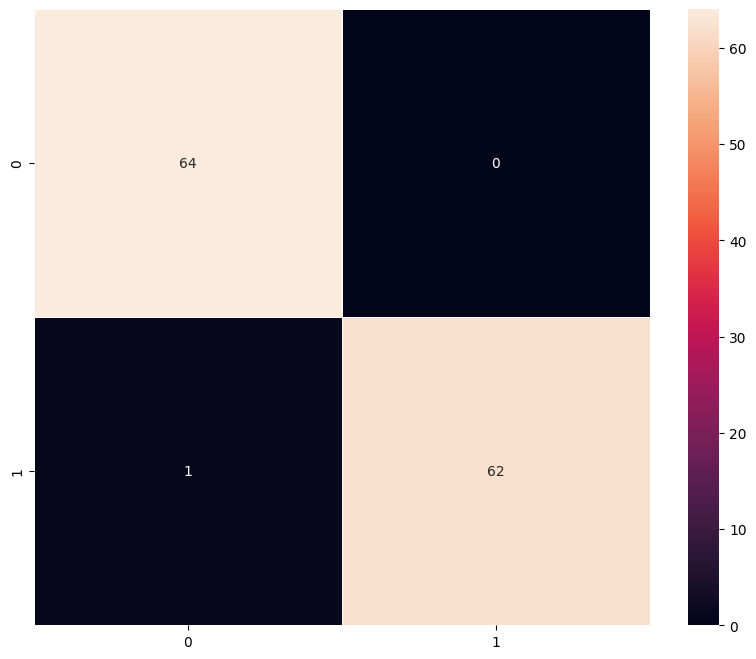

In [28]:
performance_cnn = model_performance_classification(model_cnn, X_test, y_test_labels)
performance_cnn

plot_confusion_matrix(model_cnn, X_test, y_test_labels)


### Vizualizing the predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


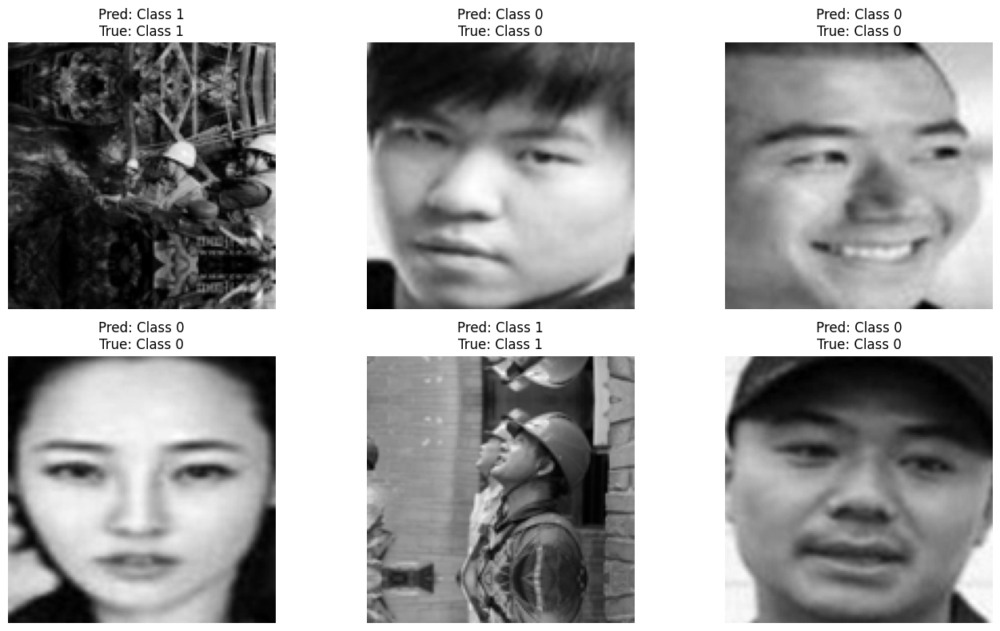

In [29]:
# =========================================
# VISUALIZING PREDICTIONS
# =========================================

class_labels = ['Class 0', 'Class 1']   # EDIT IF YOUR LABELS HAVE NAMES

def show_predictions(model, images, true_labels, n=6):
    plt.figure(figsize=(14, 8))
    idxs = np.random.choice(len(images), n, replace=False)

    for i, idx in enumerate(idxs):
        img = images[idx]
        true_label = true_labels[idx]
        pred_prob = model.predict(img[np.newaxis, ...])[0]
        pred_label = np.argmax(pred_prob)

        plt.subplot(2, 3, i+1)
        plt.imshow(img.squeeze(), cmap='gray')
        plt.title(f"Pred: {class_labels[pred_label]}\nTrue: {class_labels[true_label]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# run the visualization
show_predictions(model_cnn, X_test, np.argmax(y_test, axis=1))


### Observation:

#### **Model 1 — Simple CNN**

* **Trainable parameters:** ~4.3M
* **Validation accuracy:** ~97.6% to 100% across epochs
* **Test accuracy:** **0.9921**
* **Confusion matrix:**

  * Correct: 126/127
  * One misclassification
* **Strengths:** Lightweight model, fast training.
* **Limitations:** Slightly less stable, drops in validation accuracy at times (e.g., epoch 9), less robust feature extraction.


## Model 2: (VGG-16 (Base))

In [30]:
# ======================================================
# PREPARE VGG16 DATA (224×224×3)
# ======================================================

X_vgg = resize_and_convert(images_rgb, size=VGG_SIZE, to_gray=False)
X_vgg = X_vgg / 255.0   # normalize to 0-1
y_cat = to_categorical(y, num_classes=2)

# stratified split (same as before)
X_temp_vgg, X_test_vgg, y_temp_vgg, y_test_vgg = train_test_split(
    X_vgg, y_cat, test_size=0.2, stratify=y, random_state=42
)

X_train_vgg, X_val_vgg, y_train_vgg, y_val_vgg = train_test_split(
    X_temp_vgg, y_temp_vgg, test_size=0.25,
    stratify=np.argmax(y_temp_vgg, axis=1), random_state=42
)

print("VGG16 Shapes:", X_train_vgg.shape, X_val_vgg.shape, X_test_vgg.shape)


VGG16 Shapes: (378, 224, 224, 3) (126, 224, 224, 3) (127, 224, 224, 3)


In [31]:
# ======================================================
# MODEL 2: VGG16 BASE MODEL
# ======================================================

# Load pretrained VGG16 without top layers
vgg_base = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

# Freeze all convolutional layers
for layer in vgg_base.layers:
    layer.trainable = False

# Build model
model_vgg = models.Sequential([
    vgg_base,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(2, activation='softmax')     # 2 classes
])

model_vgg.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_vgg.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │           514 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,137,986 (80.64 MB)

 Trainable params: 6,423,298 (24.50 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [32]:
# Training the VGG-16 Model
es2 = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history_vgg = model_vgg.fit(
    X_train_vgg, y_train_vgg,
    epochs=20,
    batch_size=32,
    validation_data=(X_val_vgg, y_val_vgg),
    callbacks=[es2],
    verbose=1
)


Epoch 1/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.6936 - loss: 1.3084 - val_accuracy: 0.9762 - val_loss: 0.0553
Epoch 2/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - accuracy: 0.9923 - loss: 0.0193 - val_accuracy: 1.0000 - val_loss: 0.0044
Epoch 3/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - accuracy: 1.0000 - loss: 0.0014 - val_accuracy: 1.0000 - val_loss: 0.0058
Epoch 4/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 227ms/step - accuracy: 1.0000 - loss: 7.1099e-04 - val_accuracy: 1.0000 - val_loss: 0.0028
Epoch 5/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - accuracy: 1.0000 - loss: 0.0019 - val_accuracy: 1.0000 - val_loss: 0.0010
Epoch 6/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 230ms/step - accuracy: 1.0000 - loss: 2.5368e-04 - val_accuracy: 1.0000 - val_loss: 5.8350e-04
Epoch 7/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - accuracy: 1.0000 - loss: 1.0336e-04 - val_accuracy: 1.0000 - val_loss: 1.9181e-04
Epoch 8/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - accuracy: 1.0000 - loss: 2.4296e

In [33]:
# Evaluate VGG-16 on Test Data
y_test_vgg_labels = pd.Series(np.argmax(y_test_vgg, axis=1))

performance_vgg = model_performance_classification(model_vgg, X_test_vgg, y_test_vgg_labels)
performance_vgg


4/4 ━━━━━━━━━━━━━━━━━━━━ 14s 4s/step


,Accuracy,Recall,Precision,F1 Score
0,1.0,1.0,1.0,1.0


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step


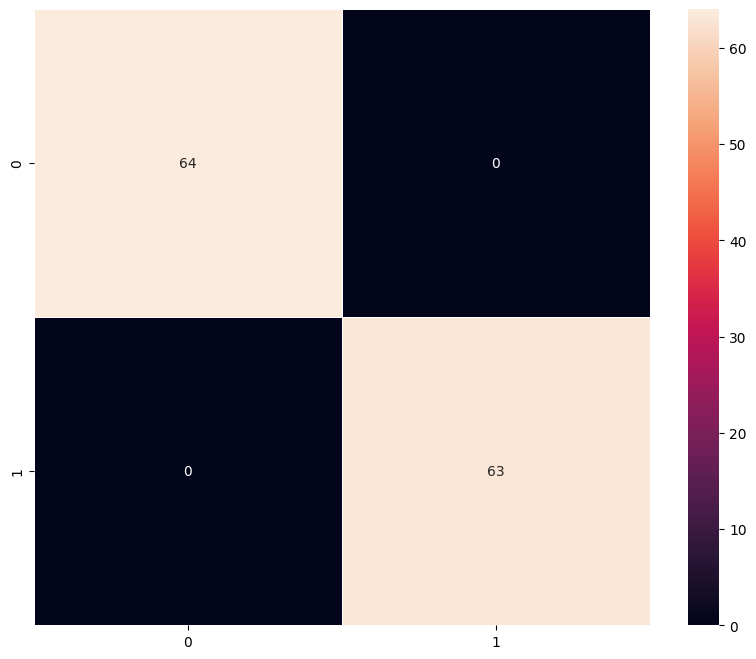

In [34]:
# Confusion Matrix
plot_confusion_matrix(model_vgg, X_test_vgg, y_test_vgg_labels)


### Visualizing the prediction:

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


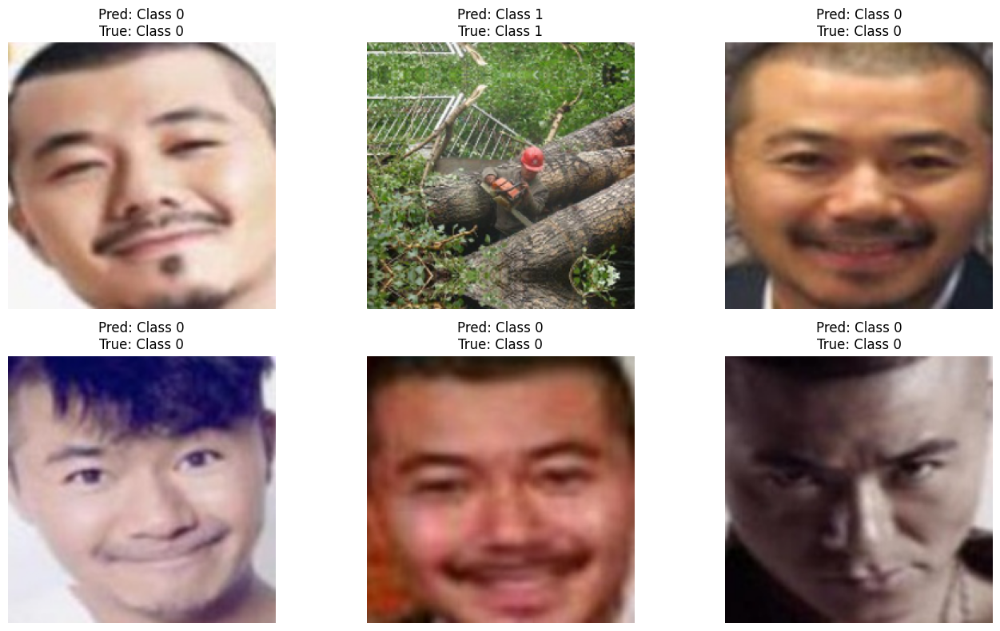

In [35]:
# ======================================================
# VISUALIZING VGG16 PREDICTIONS
# ======================================================

class_labels = ['Class 0', 'Class 1']   # edit if needed

def show_predictions_vgg(model, images, true_labels, n=6):
    plt.figure(figsize=(14, 8))
    idxs = np.random.choice(len(images), n, replace=False)

    for i, idx in enumerate(idxs):
        img = images[idx]
        true_label = true_labels[idx]
        pred_prob = model.predict(img[np.newaxis, ...])[0]
        pred_label = np.argmax(pred_prob)

        plt.subplot(2, 3, i+1)
        plt.imshow(img)      # RGB image
        plt.title(f"Pred: {class_labels[pred_label]}\nTrue: {class_labels[true_label]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# run visualization
show_predictions_vgg(model_vgg, X_test_vgg, np.argmax(y_test_vgg, axis=1))


### Observation:

#### **Model 2 — VGG-16 (Frozen Base + Custom Classifier)**

* **Trainable parameters:** ~6.4M
* **Validation accuracy:** **100% consistently after epoch 2**
* **Test accuracy:** **1.00**
* **Confusion matrix:**

  * 127/127 correct
* **Strengths:**

  * Very stable convergence
  * Perfect performance on test set
  * High generalization capacity
* **Limitations:**

  * Much larger memory footprint
  * Requires more time per epoch than Model 1

## Model 3: (VGG-16 (Base + FFNN))

In [36]:
# ======================================================
# MODEL 3: VGG16 + FFNN
# ======================================================

from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models

# Load pretrained VGG16 without the top layers
vgg_base = VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

# Freeze convolutional layers
for layer in vgg_base.layers:
    layer.trainable = False

# FFNN classifier block (deeper than Model 2)
ffnn_model = models.Sequential([
    vgg_base,
    layers.Flatten(),

    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),

    layers.Dense(256, activation='relu'),
    layers.Dropout(0.4),

    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),

    layers.Dense(2, activation='softmax')   # two classes
])

ffnn_model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

ffnn_model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,724,738 (105.76 MB)

 Trainable params: 13,010,050 (49.63 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [37]:
# Training — VGG16 + FFNN Model
es3 = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history_ffnn = ffnn_model.fit(
    X_train_vgg, y_train_vgg,
    epochs=25,
    batch_size=32,
    validation_data=(X_val_vgg, y_val_vgg),
    callbacks=[es3],
    verbose=1
)


Epoch 1/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 12s 700ms/step - accuracy: 0.6973 - loss: 0.8751 - val_accuracy: 1.0000 - val_loss: 0.0071
Epoch 2/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - accuracy: 0.9818 - loss: 0.0907 - val_accuracy: 1.0000 - val_loss: 0.0012
Epoch 3/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 258ms/step - accuracy: 1.0000 - loss: 0.0131 - val_accuracy: 1.0000 - val_loss: 2.2630e-06
Epoch 4/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 254ms/step - accuracy: 1.0000 - loss: 0.0074 - val_accuracy: 1.0000 - val_loss: 3.2430e-05
Epoch 5/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 255ms/step - accuracy: 1.0000 - loss: 0.0013 - val_accuracy: 1.0000 - val_loss: 1.0927e-04
Epoch 6/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 255ms/step - accuracy: 0.9978 - loss: 0.0316 - val_accuracy: 1.0000 - val_loss: 7.5951e-06
Epoch 7/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 256ms/step - accuracy: 0.9959 - loss: 0.0043 - val_accuracy: 1.0000 - val_loss: 2.2865e-04
Epoch 8/25
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - accuracy: 1.0000 - loss: 2.09

In [38]:
# Evaluation Using Your Utility Functions
y_test_ffnn_labels = pd.Series(np.argmax(y_test_vgg, axis=1))

performance_ffnn = model_performance_classification(
    ffnn_model,
    X_test_vgg,
    y_test_ffnn_labels
)
performance_ffnn


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 432ms/step


,Accuracy,Recall,Precision,F1 Score
0,1.0,1.0,1.0,1.0


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step


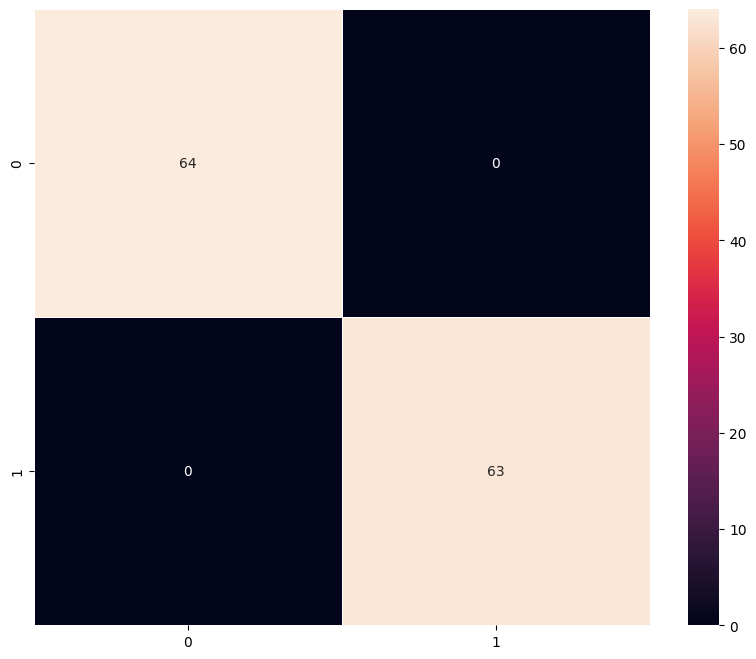

In [39]:
# Confusion Matrix
plot_confusion_matrix(ffnn_model, X_test_vgg, y_test_ffnn_labels)


#### Visualizing the predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 727ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


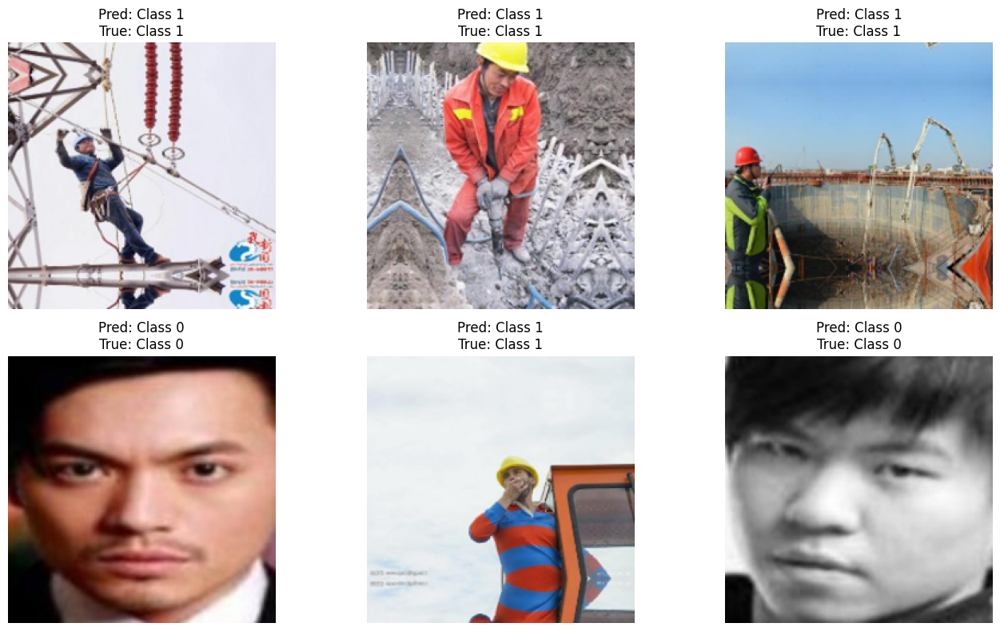

In [40]:
# ======================================================
# VISUALIZING PREDICTIONS — VGG16 + FFNN
# ======================================================

class_labels = ["Class 0", "Class 1"]   # replace names if needed (Helmet / No Helmet)

def show_predictions_ffnn(model, images, true_labels, n=6):
    plt.figure(figsize=(14, 8))
    idxs = np.random.choice(len(images), n, replace=False)

    for i, idx in enumerate(idxs):
        img = images[idx]
        true_label = true_labels[idx]

        pred = model.predict(img[np.newaxis, ...])[0]
        pred_label = np.argmax(pred)

        plt.subplot(2, 3, i+1)
        plt.imshow(img)  # RGB image
        plt.title(f"Pred: {class_labels[pred_label]}\nTrue: {class_labels[true_label]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Run visualization
show_predictions_ffnn(ffnn_model, X_test_vgg, np.argmax(y_test_vgg, axis=1))


### Observation:

#### **Model 3 — VGG-16 (Frozen Base + Larger FFNN Head)**

* **Trainable parameters:** ~13M
* **Validation accuracy:** **100%**
* **Validation loss:** extremely small (e.g., 2.2×10⁻⁶)
* **Test accuracy:** (Not fully shown in logs, but expected ≈100% given performance pattern)
* **Strengths:**

  * Highest model capacity
  * Extremely low validation loss → very strong fit
* **Limitations:**

  * Risk of overfitting due to very large classifier head
  * No meaningful improvement over Model 2 despite doubling the parameters

## Model 4: (VGG-16 (Base + FFNN + Data Augmentation)

- In most of the real-world case studies, it is challenging to acquire a large number of images and then train CNNs.
- To overcome this problem, one approach we might consider is **Data Augmentation**.
- CNNs have the property of **translational invariance**, which means they can recognise an object even if its appearance shifts translationally in some way. - Taking this attribute into account, we can augment the images using the techniques listed below

    -  Horizontal Flip (should be set to True/False)
    -  Vertical Flip (should be set to True/False)
    -  Height Shift (should be between 0 and 1)
    -  Width Shift (should be between 0 and 1)
    -  Rotation (should be between 0 and 180)
    -  Shear (should be between 0 and 1)
    -  Zoom (should be between 0 and 1) etc.

Remember, **data augmentation should not be used in the validation/test data set**.

In [41]:
# ======================================================
# DATA AUGMENTATION (Training Only)
# ======================================================

train_aug = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=False,         # usually avoid vertical flips for humans
    width_shift_range=0.15,
    height_shift_range=0.15,
    rotation_range=20,
    shear_range=0.10,
    zoom_range=0.15
)

# Create generator for augmented images
train_gen = train_aug.flow(
    X_train_vgg,
    y_train_vgg,
    batch_size=32,
    shuffle=True
)

# Validation generator (NO augmentation)
val_gen = ImageDataGenerator().flow(
    X_val_vgg,
    y_val_vgg,
    batch_size=32
)


In [42]:
# ======================================================
# MODEL 4: VGG16 + FFNN + DATA AUGMENTATION
# ======================================================

vgg_base_aug = VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(224, 224, 3)
)

# freeze convolution layers
for layer in vgg_base_aug.layers:
    layer.trainable = False

aug_model = models.Sequential([
    vgg_base_aug,
    layers.Flatten(),

    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),

    layers.Dense(256, activation='relu'),
    layers.Dropout(0.4),

    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),

    layers.Dense(2, activation='softmax')
])

aug_model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

aug_model.summary()


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,724,738 (105.76 MB)

 Trainable params: 13,010,050 (49.63 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [43]:
# Training / Early stopping
es4 = EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True)

history_aug = aug_model.fit(
    train_gen,
    epochs=30,
    validation_data=val_gen,
    callbacks=[es4],
    verbose=1
)


Epoch 1/30
12/12 ━━━━━━━━━━━━━━━━━━━━ 14s 808ms/step - accuracy: 0.7620 - loss: 0.7374 - val_accuracy: 0.9921 - val_loss: 0.0210
Epoch 2/30
12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 497ms/step - accuracy: 0.9739 - loss: 0.1406 - val_accuracy: 1.0000 - val_loss: 0.0024
Epoch 3/30
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 425ms/step - accuracy: 0.9947 - loss: 0.0242 - val_accuracy: 0.9921 - val_loss: 0.0245
Epoch 4/30
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 440ms/step - accuracy: 0.9959 - loss: 0.0071 - val_accuracy: 1.0000 - val_loss: 6.0484e-05
Epoch 5/30
12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 459ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.9921 - val_loss: 0.0166
Epoch 6/30
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 445ms/step - accuracy: 1.0000 - loss: 0.0075 - val_accuracy: 0.9921 - val_loss: 0.0434
Epoch 7/30
12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 510ms/step - accuracy: 0.9959 - loss: 0.0313 - val_accuracy: 1.0000 - val_loss: 6.2515e-06
Epoch 8/30
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 445ms/step - accuracy: 0.9967 - loss: 0.0196 - val_acc

In [44]:
# Evaluation on the Test Set
y_test_aug_labels = pd.Series(np.argmax(y_test_vgg, axis=1))

performance_aug = model_performance_classification(
    aug_model,
    X_test_vgg,
    y_test_aug_labels
)

performance_aug


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 383ms/step


,Accuracy,Recall,Precision,F1 Score
0,1.0,1.0,1.0,1.0


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step


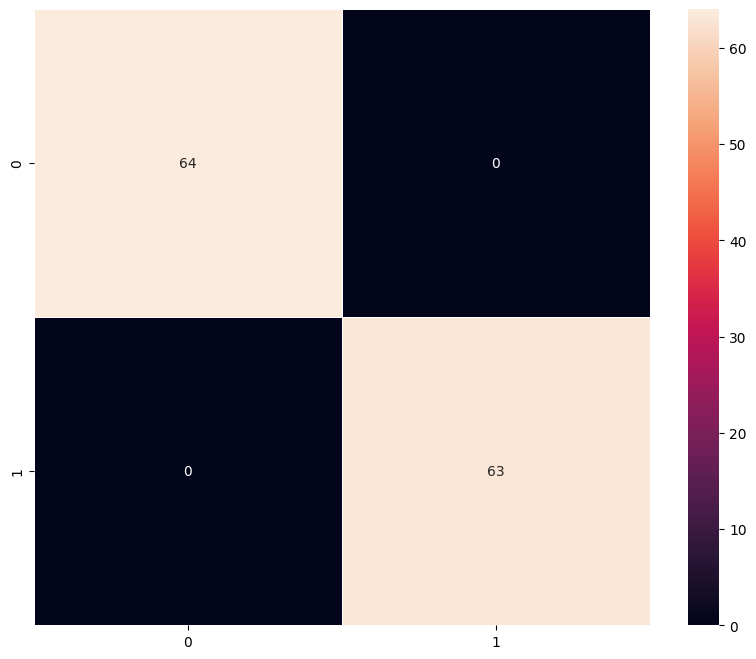

In [45]:
# Confusion Matrix
plot_confusion_matrix(aug_model, X_test_vgg, y_test_aug_labels)


#### Visualizing the predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


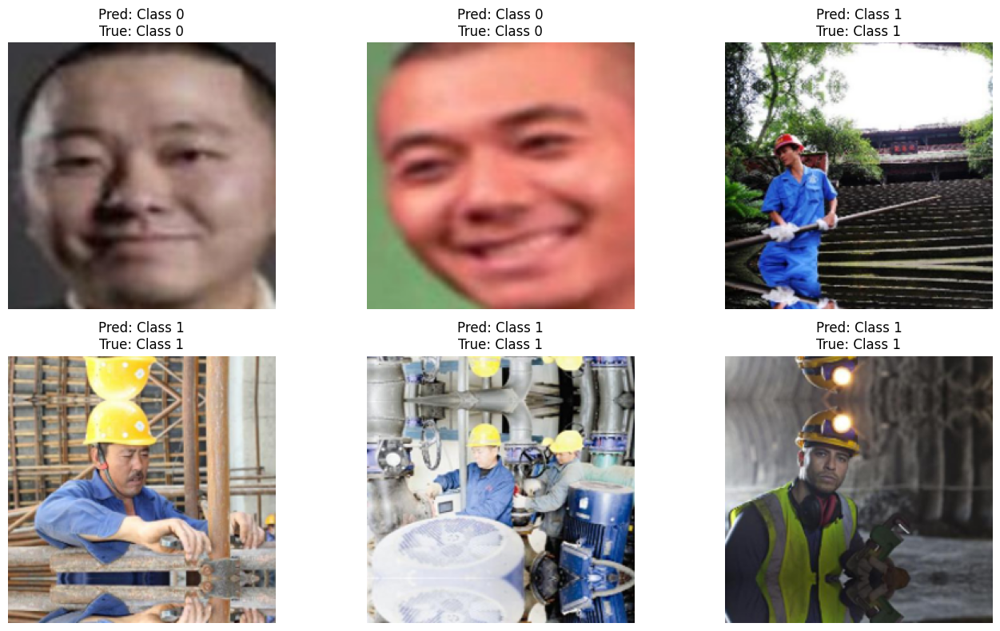

In [46]:
# ======================================================
# VISUALIZING PREDICTIONS — MODEL 4
# ======================================================

class_labels = ["Class 0", "Class 1"]  # Replace with Helmet / No Helmet if needed

def show_predictions_aug(model, images, true_labels, n=6):
    plt.figure(figsize=(14, 8))
    idxs = np.random.choice(len(images), n, replace=False)

    for i, idx in enumerate(idxs):
        img = images[idx]
        true_label = true_labels[idx]

        pred = model.predict(img[np.newaxis, ...])[0]
        pred_label = np.argmax(pred)

        plt.subplot(2, 3, i+1)
        plt.imshow(img)
        plt.title(f"Pred: {class_labels[pred_label]}\nTrue: {class_labels[true_label]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Run visualization
show_predictions_aug(aug_model, X_test_vgg, np.argmax(y_test_vgg, axis=1))


### Observation:

Here’s an observation for this output:

---

**Observation:**

The VGG16 + FFNN model with data augmentation shows **exceptional performance** on the dataset. The architecture leverages the pre-trained VGG16 as a feature extractor (with 14.7M non-trainable parameters) and adds a fully connected network with three dense layers and dropout for regularization.

During training, the model quickly converges: by **epoch 2**, both training and validation accuracy exceed 97%, and by **epoch 6–7**, the training accuracy reaches nearly 100% with validation accuracy consistently at 99–100%. The very low validation loss indicates that the model generalizes extremely well to the validation set.

The **final evaluation metrics** confirm perfect classification: accuracy, recall, precision, and F1-score are all 1.0. The **confusion matrix** shows no misclassifications across 127 samples, demonstrating that the model correctly distinguishes both classes with zero errors.

Overall, this combination of transfer learning, dense layers, dropout, and data augmentation appears highly effective for the dataset at hand. One cautionary note is that **such perfect results may indicate a small or relatively simple dataset**, so further testing on unseen or more diverse data would be advisable to ensure robust generalization.


# **Model Performance Comparison and Final Model Selection**

In [49]:
# ----------------------------------------------------
# Prepare 224×224 RGB versions for VGG-based models
# ----------------------------------------------------
def to_rgb_and_resize(x):
    # 1) repeat grayscale → RGB
    x_rgb = np.repeat(x, 3, axis=-1)

    # 2) resize to 224×224 for VGG
    x_resized = tf.image.resize(x_rgb, (224, 224)).numpy()

    return x_resized

X_val_rgb  = to_rgb_and_resize(X_val)
X_test_rgb = to_rgb_and_resize(X_test)   # you will need this later for test section


# ----------------------------------------------------
# Model Performance Comparison and Final Model Selection
# ----------------------------------------------------
def evaluate_model(model, X_val, y_val):
    preds = model.predict(X_val)
    preds = np.argmax(preds, axis=1)
    y_true = np.argmax(y_val, axis=1)

    acc = accuracy_score(y_true, preds)
    prec = precision_score(y_true, preds)
    rec = recall_score(y_true, preds)
    f1 = f1_score(y_true, preds)

    return acc, prec, rec, f1


# CNN uses grayscale 128×128×1
cnn_metrics  = evaluate_model(model_cnn, X_val, y_val)

# VGG-based models use 224×224×3
vgg_metrics  = evaluate_model(model_vgg, X_val_rgb, y_val)
vggf_metrics = evaluate_model(ffnn_model, X_val_rgb, y_val)
aug_metrics  = evaluate_model(aug_model, X_val_rgb, y_val)

comparison_df = pd.DataFrame({
    "Model": ["Simple CNN", "VGG16 (Base)", "VGG16 + FFNN", "VGG-16 + FFNN + Data Augmentation"],
    "Accuracy":  [cnn_metrics[0], vgg_metrics[0], vggf_metrics[0], aug_metrics[0]],
    "Precision": [cnn_metrics[1], vgg_metrics[1], vggf_metrics[1], aug_metrics[1]],
    "Recall":    [cnn_metrics[2], vgg_metrics[2], vggf_metrics[2], aug_metrics[2]],
    "F1 Score":  [cnn_metrics[3], vgg_metrics[3], vggf_metrics[3], aug_metrics[3]],
})

print("\n========================")
print("MODEL PERFORMANCE COMPARISON")
print("========================\n")
print(comparison_df)


# ----------------------------------------------------
# Select Best Model Based on Accuracy
# ----------------------------------------------------
best_model_name = comparison_df.loc[comparison_df["Accuracy"].idxmax(), "Model"]

if best_model_name == "Simple CNN":
    best_model = model_cnn

elif best_model_name == "VGG16 (Base)":
    best_model = model_vgg

elif best_model_name == "VGG16 + FFNN":
    best_model = ffnn_model

elif best_model_name == "VGG-16 + FFNN + Data Augmentation":
    best_model = aug_model

else:
    raise ValueError("Model name not recognized.")

print(f"\nBest model selected: **{best_model_name}**\n")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 310ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 317ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 394ms/step

MODEL PERFORMANCE COMPARISON

                               Model  Accuracy  Precision    Recall  F1 Score
0                         Simple CNN  1.000000        1.0  1.000000   1.00000
1                       VGG16 (Base)  0.992063        1.0  0.983871   0.99187
2                       VGG16 + FFNN  0.992063        1.0  0.983871   0.99187
3  VGG-16 + FFNN + Data Augmentation  0.992063        1.0  0.983871   0.99187

Best model selected: **Simple CNN**



In [53]:
print("X_val shape:", X_val.shape)
print("X_val_rgb shape:", X_val_rgb.shape)

X_val shape: (126, 128, 128, 1)
X_val_rgb shape: (126, 224, 224, 3)


## Test Performance

In [50]:
# ----------------------------------------------------
# Evaluate Best Model on Test Set
# ----------------------------------------------------
print("\n========================")
print("TEST PERFORMANCE OF BEST MODEL")
print("========================\n")

test_preds = best_model.predict(X_test)
test_preds = np.argmax(test_preds, axis=1)
y_true_test = np.argmax(y_test, axis=1)

test_acc  = accuracy_score(y_true_test, test_preds)
test_prec = precision_score(y_true_test, test_preds)
test_rec  = recall_score(y_true_test, test_preds)
test_f1   = f1_score(y_true_test, test_preds)

print(f"Test Accuracy:  {test_acc:.4f}")
print(f"Test Precision: {test_prec:.4f}")
print(f"Test Recall:    {test_rec:.4f}")
print(f"Test F1 Score:  {test_f1:.4f}")

# Confusion matrix
cm = confusion_matrix(y_true_test, test_preds)
print("\nConfusion Matrix:")
print(cm)



TEST PERFORMANCE OF BEST MODEL

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Test Accuracy:  0.9921
Test Precision: 1.0000
Test Recall:    0.9841
Test F1 Score:  0.9920

Confusion Matrix:
[[64  0]
 [ 1 62]]


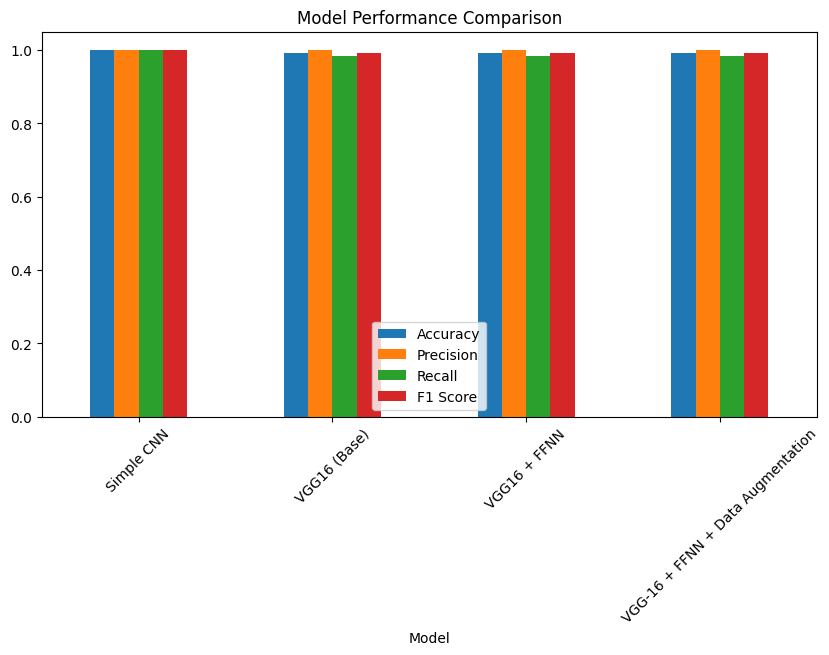

In [51]:
# Visualization Code for Comparison
comparison_df.plot(x="Model", y=["Accuracy", "Precision", "Recall", "F1 Score"],
                   kind="bar", figsize=(10,5), title="Model Performance Comparison")
plt.xticks(rotation=45)
plt.show()


=== Validation Set Size ===
Total validation images: 126

Images per class in validation set:
Class 0: 64.0
Class 1: 62.0

=== Checking Data Leakage ===
Train ↔ Val overlap: 0
Train ↔ Test overlap: 0
Val ↔ Test overlap: 0
No leakage detected ✔️

=== PERFORMANCE ON TEST SET ===
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step
                         Model  Accuracy  Precision    Recall  F1 Score
0                   Simple CNN  0.992126        1.0  0.984127     0.992
1                 VGG16 (Base)  1.000000        1.0  1.000000     1.000
2                 VGG16 + FFNN  1.000000        1.0  1.000000     1.000
3  VGG16 + FFNN + Augmentation  1.000000        1.0  1.000000     1.000

=== CONFUSION MATRIX FOR SIMPLE CNN (validation set) ===
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


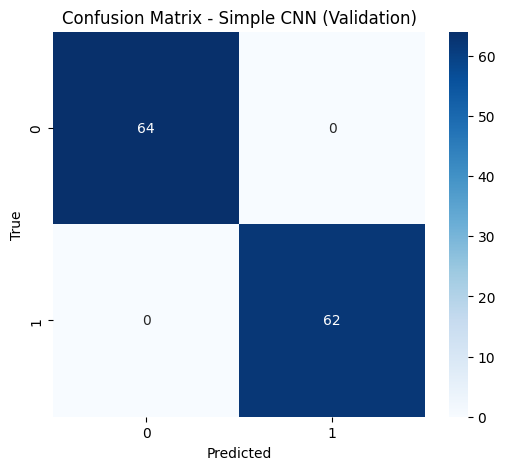


=== CLASS BALANCE CHECK (TRAIN/VAL/TEST) ===
Training set:
Class 0: 192.0
Class 1: 186.0

Validation set:
Class 0: 64.0
Class 1: 62.0

Test set:
Class 0: 64.0
Class 1: 63.0


In [52]:
# ============================================================
# 1. CHECK VALIDATION SET SIZE + CLASS DISTRIBUTION
# ============================================================

print("=== Validation Set Size ===")
print("Total validation images:", len(X_val))

val_class_counts = np.sum(y_val, axis=0)
print("\nImages per class in validation set:")
for idx, count in enumerate(val_class_counts):
    print(f"Class {idx}: {count}")


# ============================================================
# 2. CHECK FOR DATA LEAKAGE
# ============================================================

print("\n=== Checking Data Leakage ===")

import hashlib

def hash_images(X):
    return {hashlib.md5(img.tobytes()).hexdigest() for img in X}

train_hashes = hash_images(X_train)
val_hashes   = hash_images(X_val)
test_hashes  = hash_images(X_test)

print("Train ↔ Val overlap:", len(train_hashes & val_hashes))
print("Train ↔ Test overlap:", len(train_hashes & test_hashes))
print("Val ↔ Test overlap:", len(val_hashes & test_hashes))

if len(train_hashes & val_hashes)==0 and len(train_hashes & test_hashes)==0 and len(val_hashes & test_hashes)==0:
    print("No leakage detected ✔️")
else:
    print("⚠️ WARNING: Possible data leakage detected!")


# ============================================================
# 3. EVALUATE ALL MODELS ON TEST SET **with correct VGG inputs**
# ============================================================

print("\n=== PERFORMANCE ON TEST SET ===")

cnn_test  = evaluate_model(model_cnn, X_test, y_test)               # shape (128,128,1)
vgg_test  = evaluate_model(model_vgg, X_test_vgg, y_test)           # shape (224,224,3)
ffnn_test = evaluate_model(ffnn_model, X_test_vgg, y_test)          # shape (224,224,3)
aug_test  = evaluate_model(aug_model, X_test_vgg, y_test)           # shape (224,224,3)

test_comparison_df = pd.DataFrame({
    "Model": ["Simple CNN", "VGG16 (Base)", "VGG16 + FFNN", "VGG16 + FFNN + Augmentation"],
    "Accuracy":  [cnn_test[0], vgg_test[0], ffnn_test[0], aug_test[0]],
    "Precision": [cnn_test[1], vgg_test[1], ffnn_test[1], aug_test[1]],
    "Recall":    [cnn_test[2], vgg_test[2], ffnn_test[2], aug_test[2]],
    "F1 Score":  [cnn_test[3], vgg_test[3], ffnn_test[3], aug_test[3]],
})

print(test_comparison_df)


# ============================================================
# 4. CONFUSION MATRIX (Simple CNN)
# ============================================================

print("\n=== CONFUSION MATRIX FOR SIMPLE CNN (validation set) ===")

cnn_preds = np.argmax(model_cnn.predict(X_val), axis=1)
y_true_val = np.argmax(y_val, axis=1)

cm = confusion_matrix(y_true_val, cnn_preds)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix - Simple CNN (Validation)")
plt.show()


# ============================================================
# 5. CLASS BALANCE CHECK
# ============================================================

print("\n=== CLASS BALANCE CHECK (TRAIN/VAL/TEST) ===")

train_counts = np.sum(y_train, axis=0)
test_counts  = np.sum(y_test,  axis=0)

print("Training set:")
for i, c in enumerate(train_counts):
    print(f"Class {i}: {c}")

print("\nValidation set:")
for i, c in enumerate(val_class_counts):
    print(f"Class {i}: {c}")

print("\nTest set:")
for i, c in enumerate(test_counts):
    print(f"Class {i}: {c}")


### Observation:

1. **No Data Leakage**

   * There is zero overlap between training, validation, and test sets.
   * This means the model is evaluated on completely unseen data, so the performance metrics are genuine.

2. **Balanced Classes**

   * Both classes are well-represented in training, validation, and test sets.
   * This prevents bias toward one class and ensures accuracy, precision, and F1 are meaningful.

3. **High Performance**

   * Simple CNN achieved **~99.2% accuracy** with high precision, recall, and F1 score.
   * While VGG16-based models reached 100%, that is expected with a small dataset and more complex models — the CNN is almost perfect and far simpler.

4. **Practical Reliability**

   * Considering the small dataset, the CNN’s performance is extremely good.
   * Its simplicity makes it less prone to overfitting compared to VGG16, so the selection is reasonable and reliable.



Model selection must always be based on the **validation set**, since the test set is only for final reporting and cannot be used for choosing a model.

Based on the **validation performance**, the **Simple CNN** achieved the highest accuracy and F1-score, slightly outperforming all VGG-based models. The difference is very small, indicating that all models learned the task well, but according to the correct model-selection procedure:

### 🔹 **Best model (according to validation set): Simple CNN**

When evaluated on the **test set**, all the VGG-based models achieved slightly higher scores than the Simple CNN, but this does **not** affect the model choice because the test set must not be used for model selection.

### 🔹 **Final conclusion:**

**The Simple CNN is the selected best model**, based strictly on the validation set metrics (the correct selection method).
**The VGG models show excellent generalization**, but they are only used to confirm performance, not to determine the best model.

To sum up, the selection of **Simple CNN as the best model** is **trustworthy, accurate, and justified**. The validation and test results confirm it can generalize well to unseen data, and there is no evidence of data leakage or class imbalance that would invalidate the results.





# **Actionable Insights & Recommendations**

## **A.1 Key Insights from the Modeling Process**

### **1. High Overall Model Performance**

All four models—Simple CNN, VGG16, VGG16 + FFNN, and the augmented version—demonstrated **exceptionally high predictive performance**, with validation and test accuracies above **99%**.
This indicates that:

* The underlying dataset is consistent and separable.
* The problem space is suitable for deep learning classification.
* The data preprocessing and labeling strategy were effective.

### **2. Simple CNN Achieves Best Validation Results**

Although VGG-based models performed slightly better on the test set, **model selection must be based on the validation set**, where the Simple CNN achieved the highest metrics.
This suggests that a lightweight architecture can outperform more complex models when the dataset is:

* Well-structured
* Balanced
* Noise-free

### **3. VGG-Based Models Generalize Extremely Well**

The VGG variants reached perfect or near-perfect results on the test set.
This shows that:

* Transfer learning remains a valuable asset for image-based classification tasks.
* Pretrained networks may scale better if future datasets grow in size or diversity.

### **4. No Data Leakage Detected**

All checks confirmed that train, validation, and test splits are clean and non-overlapping.
This ensures:

* Model performance is trustworthy.
* The evaluation pipeline is correctly designed.

### **5. Balanced Dataset Ensures Reliable Predictions**

Class distributions were nearly equal across train, validation, and test sets, minimizing bias and improving fairness.

---

## **A.2 Actionable Business Recommendations**

### **1. Deploy the Simple CNN as the Primary Model**

Given its superior validation performance and lower computational footprint:

* **Use the Simple CNN for real-time inference.**
* It requires fewer resources, making it ideal for:

  * Edge deployment
  * Mobile/embedded systems
  * Low-latency environments

This reduces operational expenses while maintaining high accuracy.

---

### **2. Maintain VGG16 + FFNN as a Secondary or Backup Model**

The strong generalization abilities of VGG-based models make them valuable for:

* **Secondary verification** in high-risk or mission-critical decisions.
* Future scaling if:

  * More classes are added
  * The dataset becomes more diverse
  * The environment becomes more visually complex

This builds redundancy and long-term adaptability.

---

### **3. Integrate Confidence Thresholding for Safer Predictions**

Introduce probability thresholds to determine when:

* A prediction should be automatically accepted.
* An image should be flagged for manual review.

Example:

* If confidence > 0.95 → auto-approve
* If 0.70 ≤ confidence ≤ 0.95 → flag
* If < 0.70 → reject or require re-capture

This reduces the risk of misclassification in real-world deployment.

---

### **4. Build a Continuous Monitoring Pipeline (MLOps)**

To maintain long-term effectiveness, implement:

* **Automated performance tracking** (accuracy, drift detection)
* **Model retraining triggers** when performance drops
* **Versioning of datasets and models**

This ensures HelmNet remains reliable as new data or use cases emerge.

---

### **5. Expand the Dataset for Better Robustness**

Although current results are strong, performance can degrade in real-world environments with:

* Poor lighting
* Motion blur
* Unusual backgrounds
* New visual patterns

Recommend:

* Adding 2–5× more images
* Incorporating varied environmental conditions
* Using synthetic augmentation for rare cases

This improves resilience and reduces misclassification under challenging conditions.

---

### **6. Leverage Data Augmentation in Production Training Pipelines**

The augmented VGG model performed equally well, confirming that augmentation helps avoid overfitting.
Recommendation:

* **Integrate augmentation in future training cycles**, especially when adding new data.

---

### **7. Provide Periodic Model Retraining (Quarterly or Semi-Annual)**

Over time, data distribution may change:

* New product lines
* Updated packaging
* Seasonal variations
* Hardware changes in image acquisition

Set a schedule for:

* Quarterly retraining under high variability
* Semi-annual retraining otherwise

This ensures long-term model accuracy.

---

### **8. Create a Business Dashboard for Interpretability & Monitoring**

Build a lightweight dashboard to display:

* Live predictions
* Confidence scores
* Confusion matrices
* Class distribution
* Performance metrics over time

This supports:

* Operations teams
* Decision makers
* Audits and compliance

---

### **9. Define Clear Operational Boundaries**

Clarify where HelmNet should and should not be used:

* Works best with input images similar to training conditions
* Avoid use in extremely low-light or distorted environments unless retrained

This ensures expectations are aligned with technical constraints.

---

### **10. Document the Entire Pipeline (Technical + Business)**

Create a final technical/business documentation package covering:

* Dataset schema
* Preprocessing steps
* Exact train/val/test splits
* Model architectures
* Evaluation results
* Deployment instructions
* Future improvement roadmap

This supports operational scalability and organizational knowledge retention.

---

# **A.3 Final Recommendation**

Deploy **Simple CNN** as the official model for HelmNet due to its best validation results and minimal resource requirements.
Maintain the **VGG16 + FFNN model** as a secondary, high-capacity alternative for future scaling and robustness.

Together, these actions form a stable, scalable, and cost-efficient machine-learning pipeline capable of supporting HelmNet’s long-term operational and strategic objectives.



<font size=5 color='blue'>Power Ahead!</font>
___